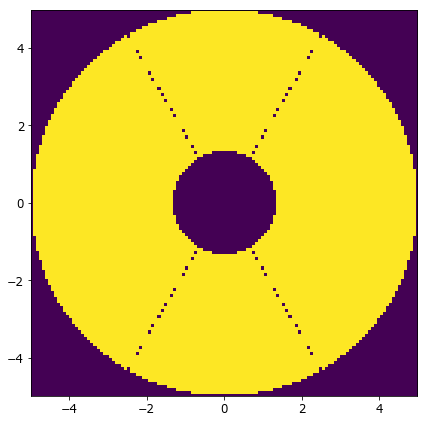

In [1]:
from hcipy import *
import numpy as np
from matplotlib import pyplot as plt

D_keck = 9.96 #m
spider_width = 0.0254 #m
central_obscuration_ratio = 0.266
keck_aperture = make_obstructed_circular_aperture(D_keck, central_obscuration_ratio, 6, spider_width)
# equivalent for the Magellan telescope in aperture/realistic.py

pupil_grid = make_pupil_grid(128, D_keck)
imshow_field(keck_aperture(pupil_grid))
plt.show()
# slight visual glitch - the horizontal spiders aren't visible. Increasing spider_width shows them.

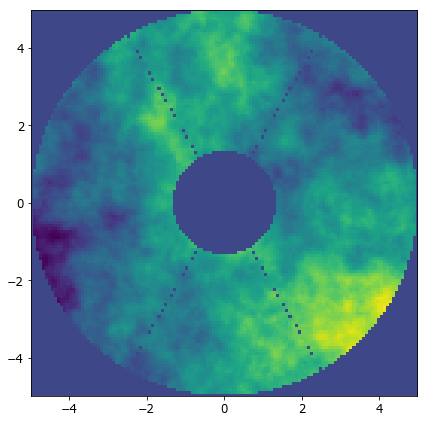

In [2]:
def make_atmosphere(input_grid):
    #Uses the Guyon & Males 2017 model.
    heights = np.array([500, 1000, 2000, 4000, 8000, 16000, 32000])
    velocities = np.array([[0.6541, 6.467], [0.005126, 6.55], [-0.6537, 6.568], [-1.326, 6.568], 
                           [-21.98, 0.9], [-9.484, -0.5546], [-5.53, -0.8834]])
    outer_scales = np.array([2, 20, 20, 20, 30, 40, 40])
    Cn_squared = np.array([0.672, 0.051, 0.028, 0.106, 0.08, 0.052, 0.012]) * 1e-12
    layers = []
    for h, v, o, cn in zip(heights, velocities, outer_scales, Cn_squared):
        l = InfiniteAtmosphericLayer(input_grid, cn, o, v, h, 2)
        layers.append(l)
    
    return layers
    # There's a bug in the atmospheric simulation, so for testing we'll just apply a sine wave instead of this

keck_field = keck_aperture(pupil_grid)
aberrated_wf = Wavefront(keck_field)
for layer in make_atmosphere(pupil_grid):
    aberrated_wf = layer(aberrated_wf)
    
imshow_field(aberrated_wf.phase * keck_field)
plt.show()

/Users/adityasengupta/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: This function does not work as expected and will be changed in a future update.
  if __name__ == '__main__':


Plotting sub-images: 


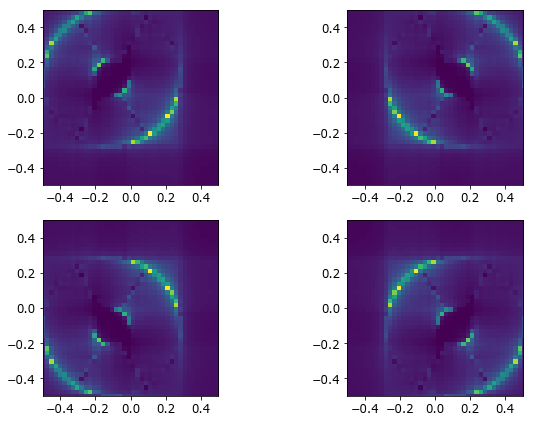

In [3]:
pyramid_wfs = PyramidWavefrontSensorOptics(pupil_grid, pupil_separation=1.6) 
# Set pupil_separation to 1 to see all sub-images distinctly with no buffer space. Haven't completely customized 
# this part for Keck yet.
guess = PyramidWavefrontSensorEstimator(keck_aperture, pyramid_wfs.output_grid)

# edited version of built-in function, in wavefront_sensing/pyramid.py
def estimate(EstimatorObject, images):
    import warnings
    warnings.warn("This function does not work as expected and will be changed in a future update.", RuntimeWarning)

    image = images.shaped
    sub_shape = image.grid.shape // 2

    I_a = image[:sub_shape[0], :sub_shape[1]]
    I_b = image[sub_shape[0]:2*sub_shape[0], :sub_shape[1]]
    I_c = image[sub_shape[0]:2*sub_shape[0], sub_shape[1]:2*sub_shape[1]]
    I_d = image[:sub_shape[0], sub_shape[1]:2*sub_shape[1]]
 
    print("Plotting sub-images: ")
    sub_images = [I_b, I_c, I_a, I_d]
    for count, img in enumerate(sub_images):
        img = img.ravel()
        img.grid = make_pupil_grid(sub_shape[0])
        assert(img.is_valid_field)
        plt.subplot(2,2,count+1)
        imshow_field(img)
    plt.show()

    norm = I_a + I_b + I_c + I_d

    I_x = (I_a + I_b - I_c - I_d) / norm
    I_y = (I_a - I_b - I_c + I_d) / norm

    I_x = I_x.ravel()[EstimatorObject.pupil_mask>0] 
    I_y = I_y.ravel()[EstimatorObject.pupil_mask>0]
    # Keeping pupil_mask>0 in makes the output a strange shape - I got 2x596 the first time I ran this. 
    # So imshow_field doesn't work on the output. After taking it out, imshow_field still doesn't work, and 
    # the scatter plot generated is just an evenly spaced set of points. This is probably why there was a 
    # warning at the top. I'm currently working on how to represent/interpret the results from this.

    res = Field([I_x, I_y], EstimatorObject.pupil_mask.grid)
    return res

guessing_images = pyramid_wfs.forward(aberrated_wf).intensity
a = estimate(guess, guessing_images)

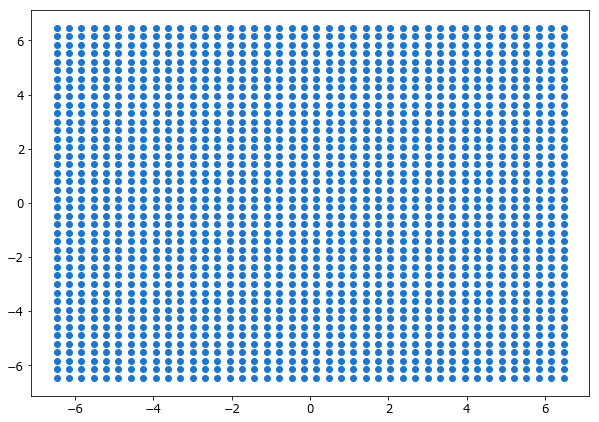

In [4]:
plt.scatter(a.grid.x, a.grid.y)
plt.show()

# Earlier I was getting a weird pattern by running this, but I can't seem to reproduce that now.
# I'm including it as an image instead.

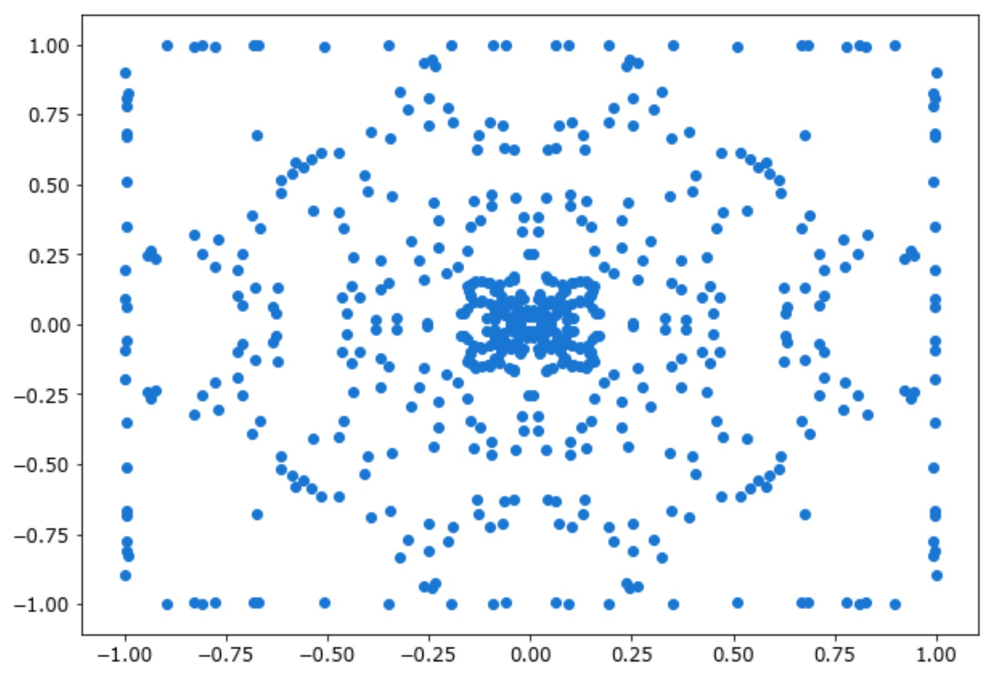

In [5]:
from IPython.display import Image
Image("pyramid_output_prev.jpeg")

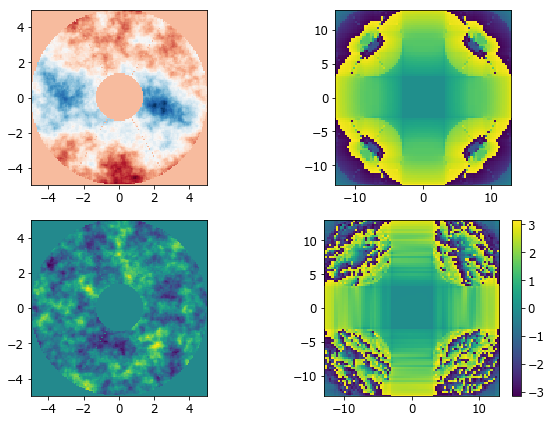

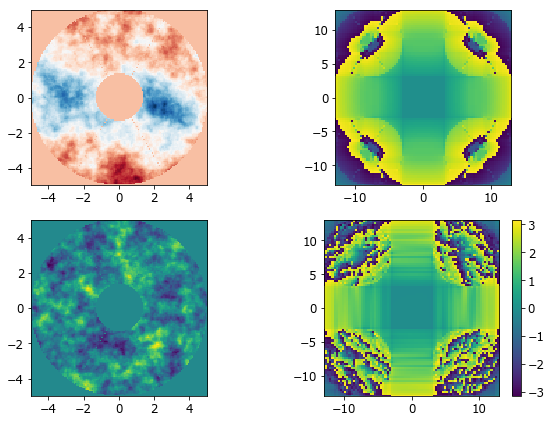

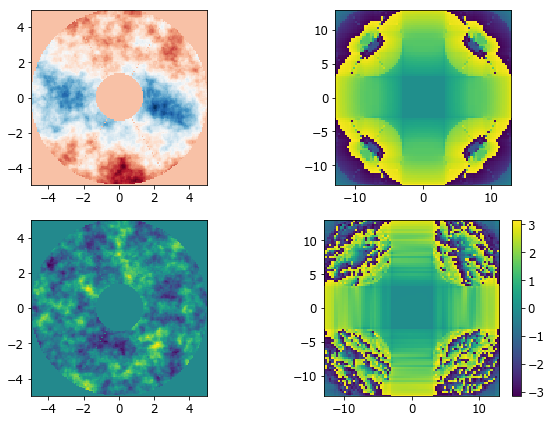

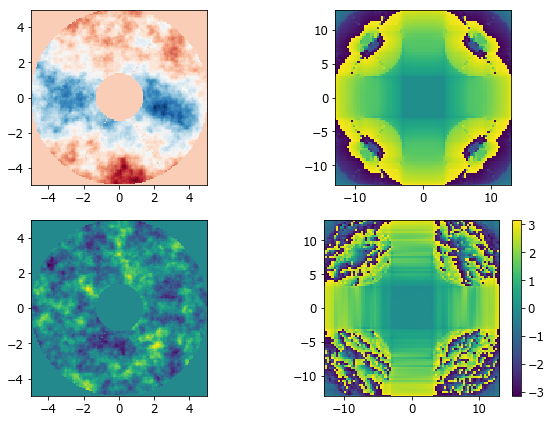

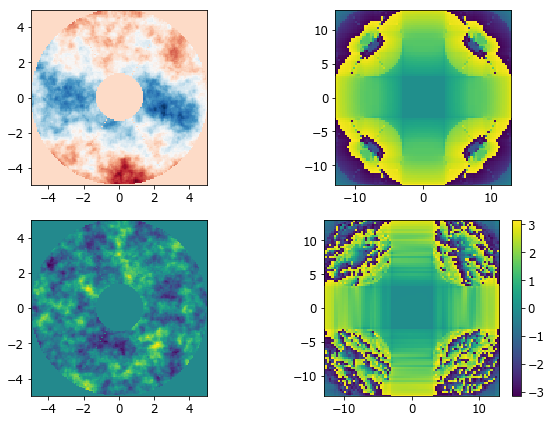

...

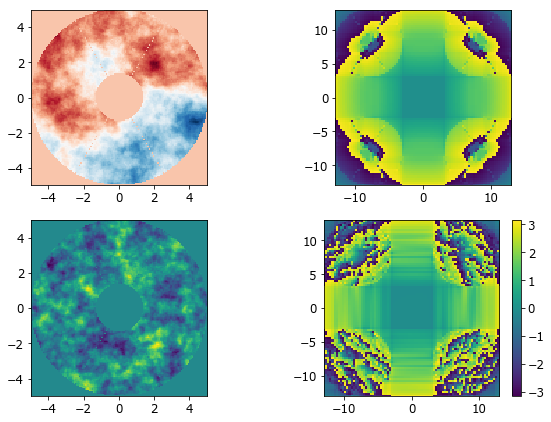

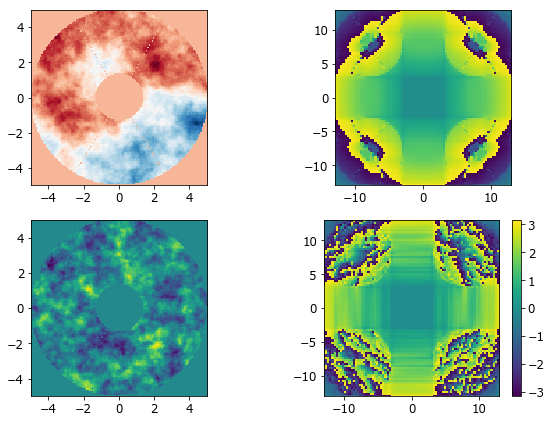

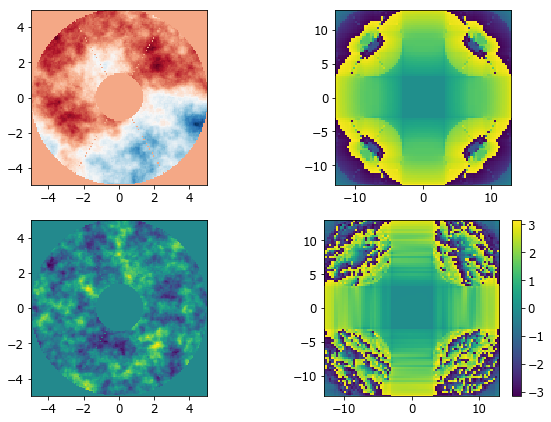

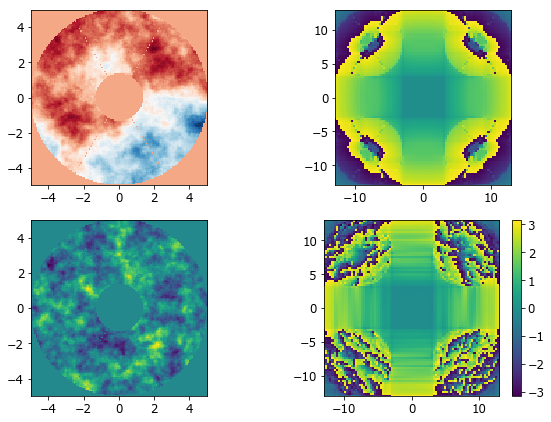

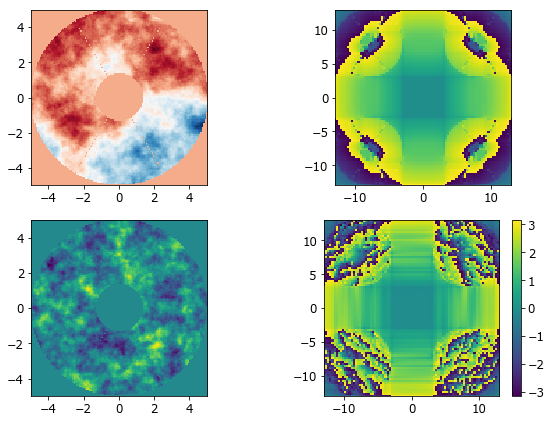

FileNotFoundError: [Errno 2] No such file or directory: 'convert': 'convert'

In [6]:
# Should only be run on terminal; running here doesn't clear images in each iteration
def timelapse(aperture, input_grid):
    speed = 1
    times = np.arange(0, 1.0 * speed, 0.01 * speed)
    mw = GifWriter('adaptive_optics2.gif', 10)
    atmosphere = make_atmosphere(input_grid)
    fake_atmosphere = InfiniteAtmosphericLayer(input_grid, 0.1, 2, 0, 5000, 2)
    for t in times:
        wf = Wavefront(aperture(input_grid))
        wf_clean = Wavefront(aperture(input_grid))
        assert(wf_clean is not wf)
        for layer in atmosphere:
            layer.t = t
            wf = layer(wf)
        fake_atmosphere.t = t
        wf_clean = fake_atmosphere(wf_clean)
        # my_phase = wf.phase * aperture(input_grid)
        # my_phase[my_phase==0] = np.nan
        # print(  np.sqrt(np.nanmean(my_phase**2)) * (0.5/(2*np.pi)) , ' microns' )
        # print(  np.sqrt(np.nanmean(atmos.phase_for(wavelength)**2)) * (0.5/(2*np.pi)) , ' microns' )
        plt.clf()
        #imshow_field(atmos.phase_for(wavelength)* aperture(pupil_grid),  cmap='RdBu')
        plt.subplot(2,2,1)
        imshow_field(wf.phase * aperture(input_grid), cmap='RdBu')
        plt.subplot(2,2,2)
        imshow_field(pyramid_wfs.forward(wf).phase)
        plt.subplot(2,2,3)
        imshow_field(wf_clean.phase * aperture(input_grid))
        plt.subplot(2,2,4)
        imshow_field(pyramid_wfs.forward(wf_clean).phase)# - pyramid_wfs.forward(wf).phase)
        plt.colorbar()
        plt.draw()
        plt.pause(0.00001)
    mw.close()

timelapse(keck_aperture, pupil_grid)